In [1]:
%load_ext autoreload
%autoreload 2

# TP1 - Panoramica

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


from i308_utils import show_images, imshow

### Conjunto de imágenes

In [3]:

# Udesa
L_udesa = cv2.imread('img/fotos nuestras/izqu.jpg', cv2.IMREAD_COLOR)
C_udesa = cv2.imread('img/fotos nuestras/cent.jpg', cv2.IMREAD_COLOR)
R_udesa = cv2.imread('img/fotos nuestras/der.jpg', cv2.IMREAD_COLOR)


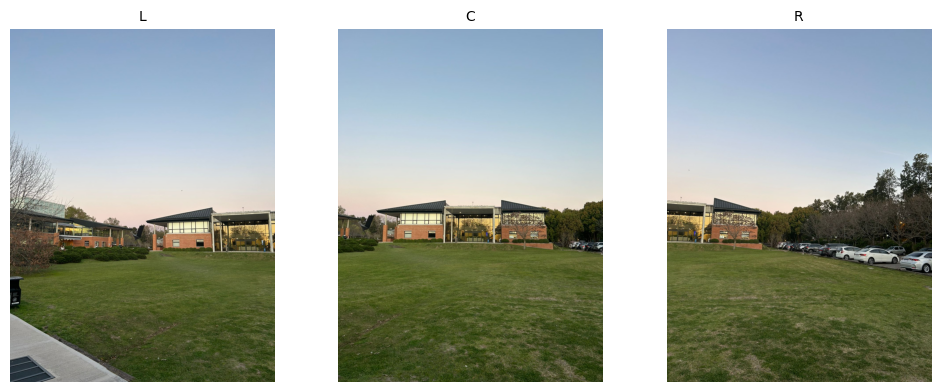

In [4]:
show_images([L_udesa, C_udesa, R_udesa], ['L', 'C', 'R'])



## Detección de características

In [5]:
from src.utils import  detectar_caracteristicas

sift = cv2.SIFT_create()


L_udesa_kp, L_udesa_responses, L_udesa_des = detectar_caracteristicas(L_udesa, sift)
C_udesa_kp, C_udesa_responses, C_udesa_des = detectar_caracteristicas(C_udesa, sift)
R_udesa_kp, R_udesa_responses, R_udesa_des = detectar_caracteristicas(R_udesa, sift)

print(f"Detectados {len(L_udesa_kp)} keypoints")
print(f"Detectados {len(C_udesa_kp)} keypoints")
print(f"Detectados {len(R_udesa_kp)} keypoints")


Detectados 7095 keypoints
Detectados 7223 keypoints
Detectados 9995 keypoints


In [6]:
from src.graficos import graficar_puntos

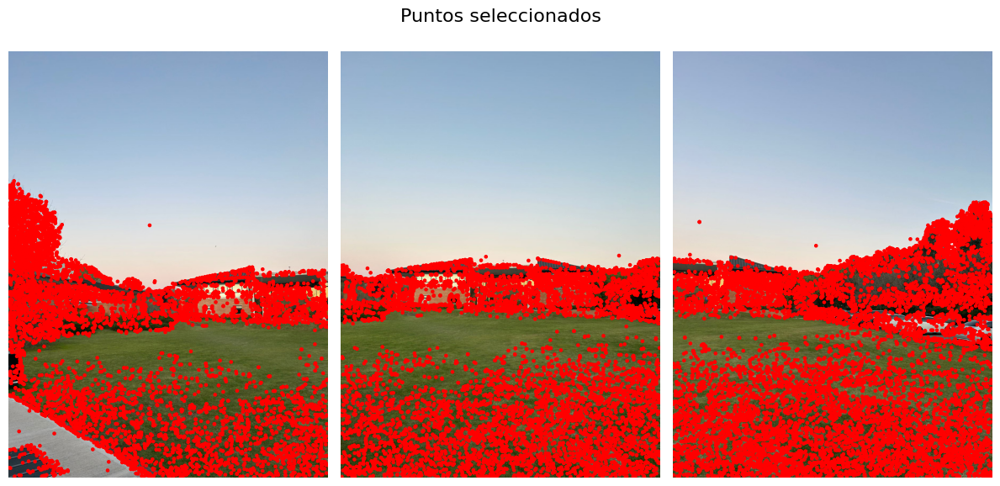

In [7]:

campus=[L_udesa, C_udesa, R_udesa]
puntos_campus=[L_udesa_kp, C_udesa_kp, R_udesa_kp]
graficar_puntos(campus, puntos_campus)

## Supresión de No Máxima Adaptativa

In [8]:
from src.utils import  anms


In [9]:
num=1500


L_udesa_kp_sel, L_udesa_resp_sel, L_udesa_idx_sel = anms(L_udesa_kp, L_udesa_responses, N=num)
C_udesa_kp_sel, C_udesa_resp_sel, C_udesa_idx_sel = anms(C_udesa_kp, C_udesa_responses, N=num)
R_udesa_kp_sel, R_udesa_resp_sel, R_udesa_idx_sel = anms(R_udesa_kp, R_udesa_responses, N=num)


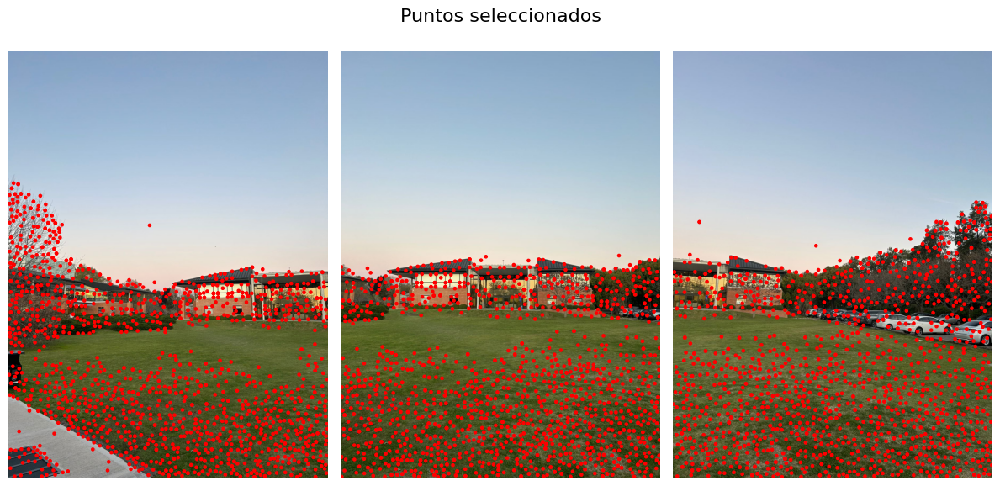

In [10]:

campus=[L_udesa, C_udesa, R_udesa]
puntos_campus=[L_udesa_kp_sel, C_udesa_kp_sel, R_udesa_kp_sel]
graficar_puntos(campus, puntos_campus)

## Asociación de correspondencias (matching)

In [11]:
from src.graficos import match_descriptors,draw_matches_side_by_side


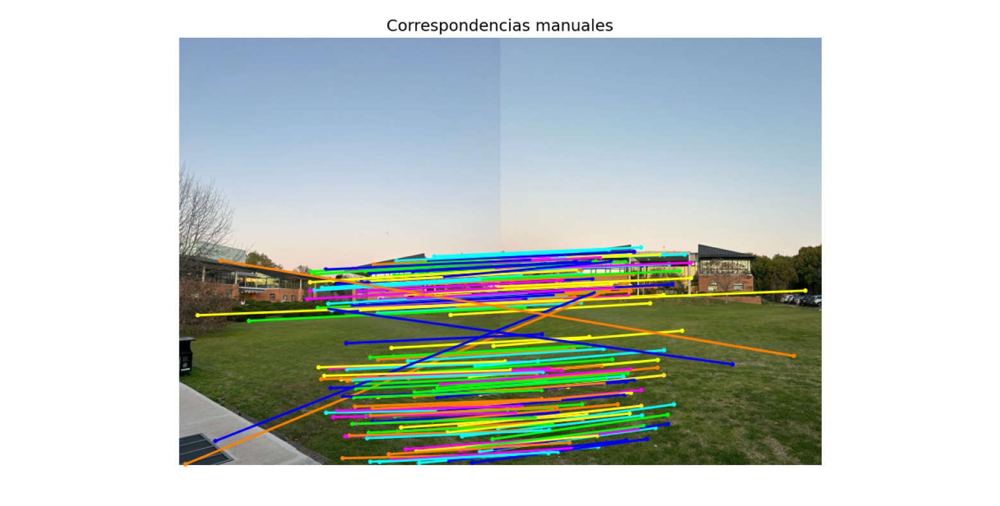

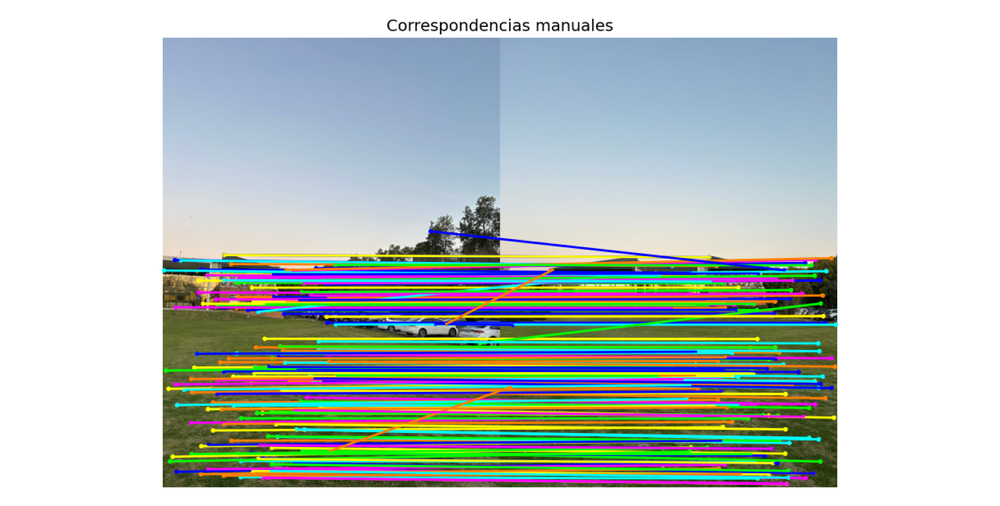

In [12]:

udesa_descrip_iz = L_udesa_des[L_udesa_idx_sel]
udesa_descrip_centro = C_udesa_des[C_udesa_idx_sel]
udesa_descrip_der = R_udesa_des[R_udesa_idx_sel]



matches_udesa_IZ_CEN,pts1_udesa_IZ_CEN,pts2_udesa_IZ_CEN = match_descriptors(udesa_descrip_iz, udesa_descrip_centro,
                                                            kps1=L_udesa_kp_sel, kps2=C_udesa_kp_sel,
                                                            ratio_thresh=0.75, cross_check=True)
udesa_iz_cen = draw_matches_side_by_side(L_udesa, C_udesa, pts1_udesa_IZ_CEN, pts2_udesa_IZ_CEN)

matches_udesa_CEN_DER,pts1_udesa_CEN_DER,pts2_udesa_CEN_DER = match_descriptors(udesa_descrip_der, 
                                                                                   udesa_descrip_centro,
                                                                kps1=R_udesa_kp_sel, kps2=C_udesa_kp_sel,
                                                                ratio_thresh=0.75, cross_check=True)
udesa_cen_der = draw_matches_side_by_side(R_udesa, C_udesa, pts1_udesa_CEN_DER, pts2_udesa_CEN_DER)

imshow(udesa_iz_cen, figsize=(20,10))
imshow(udesa_cen_der, figsize=(20,10))

## Estimación de la Homografía 

In [13]:
from src.utils import  pick_points_cv,_homography_dlt


In [14]:
# ==================== Conjunto UDESA ====================
# L <-> C
pts_L_udesa       = pick_points_cv(L_udesa, win_name="UDESA - L: elegí 4 puntos")
pts_C_for_L_udesa = pick_points_cv(C_udesa, win_name="UDESA - C para L: elegí los mismos 4 puntos")
H_LC_udesa        = _homography_dlt(pts_L_udesa, pts_C_for_L_udesa)

print("\n[UDESA] H_LC_udesa:\n", H_LC_udesa)

# R <-> C
pts_R_udesa       = pick_points_cv(R_udesa, win_name="UDESA - R: elegí 4 puntos")
pts_C_for_R_udesa = pick_points_cv(C_udesa, win_name="UDESA - C para R: elegí los mismos 4 puntos")
H_RC_udesa        = _homography_dlt(pts_R_udesa, pts_C_for_R_udesa)

print("\n[UDESA] H_RC_udesa:\n", H_RC_udesa)



[UDESA] H_LC_udesa:
 [[ 9.30501121e-01 -2.45114188e-01 -2.04806177e+02]
 [ 1.34509555e-01  6.09987317e-01  1.04737950e+02]
 [ 1.38450463e-04 -2.48635625e-04  1.00000000e+00]]

[UDESA] H_RC_udesa:
 [[ 6.81936538e-01  9.93808610e-02  4.58807850e+02]
 [-2.43788021e-01  8.61436408e-01  1.06446769e+02]
 [-2.37640094e-04 -3.29201061e-05  1.00000000e+00]]


In [15]:
from src.graficos import draw_matches_side_by_side


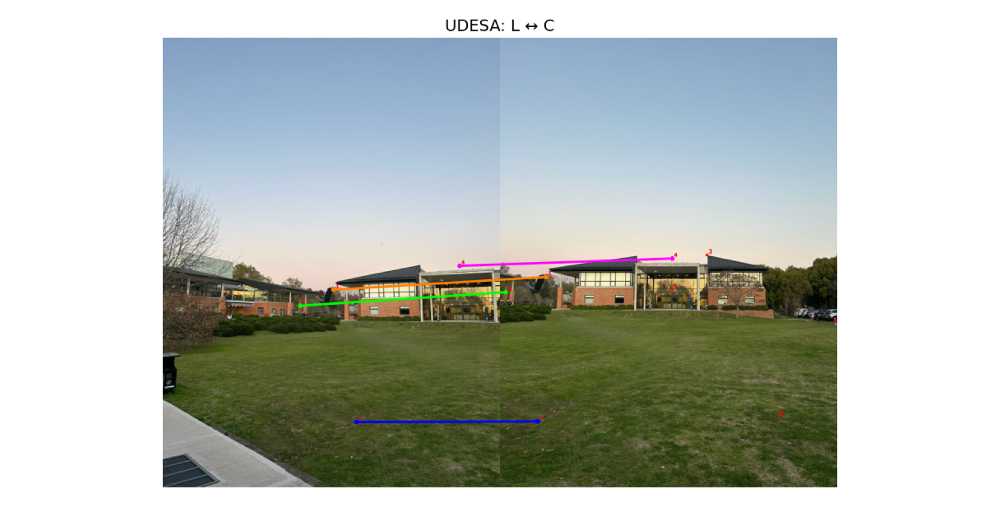

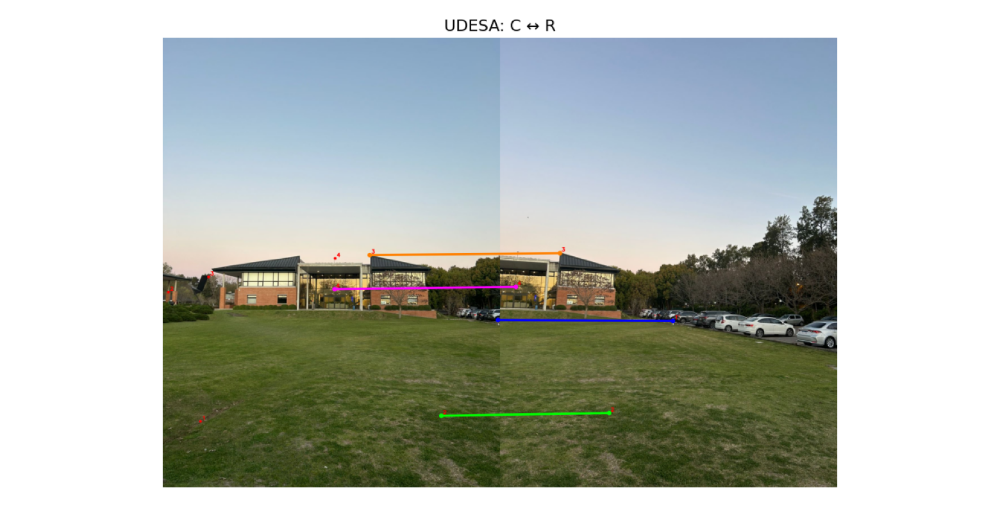

In [16]:

# ====== UDESA ======
# L ↔ C

udesa_L_C=draw_matches_side_by_side(
    L_udesa, C_udesa,
    pts_L_udesa, pts_C_for_L_udesa,
    title="UDESA: L ↔ C"
)

# C ↔ R

udesa_R_C=draw_matches_side_by_side(
    C_udesa, R_udesa,
    pts_C_for_R_udesa, pts_R_udesa,
    title="UDESA: C ↔ R"
)


imshow(udesa_L_C, figsize=(20,10))
imshow(udesa_R_C, figsize=(20,10))



## Eliminación de outliers utilizando RANSAC

In [18]:
from src.utils import ransac_homography

In [19]:

# UDESA L ↔ C

result_UDESA_IZ_CEN = ransac_homography(pts1_udesa_IZ_CEN, pts2_udesa_IZ_CEN)

# UDESA C ↔ R

result_UDESA_CEN_DER = ransac_homography(pts1_udesa_CEN_DER, pts2_udesa_CEN_DER)




In [20]:
from src.graficos import draw_matches_ransac


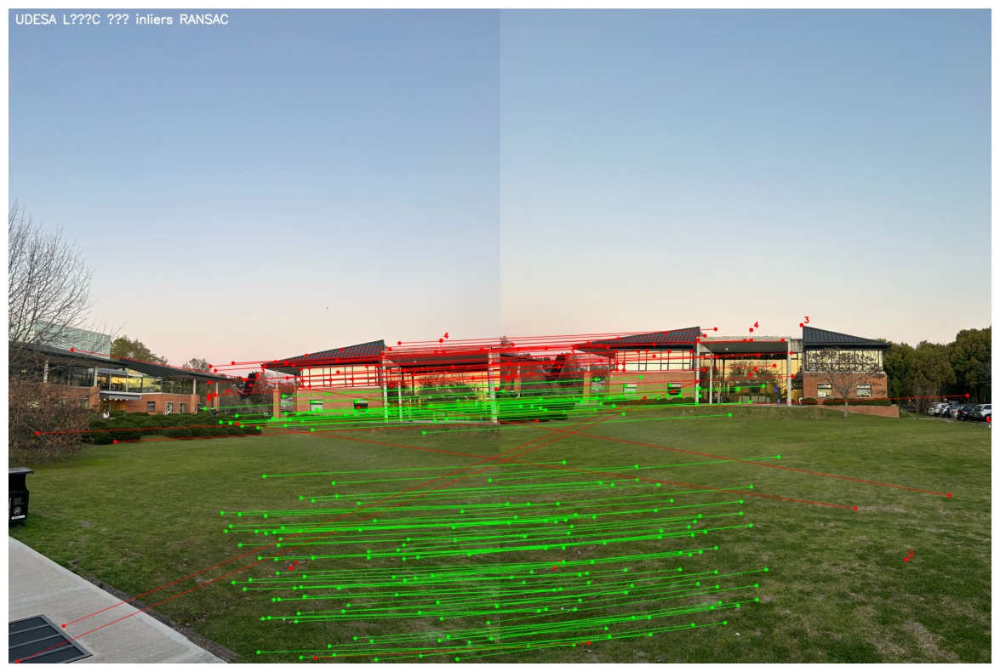

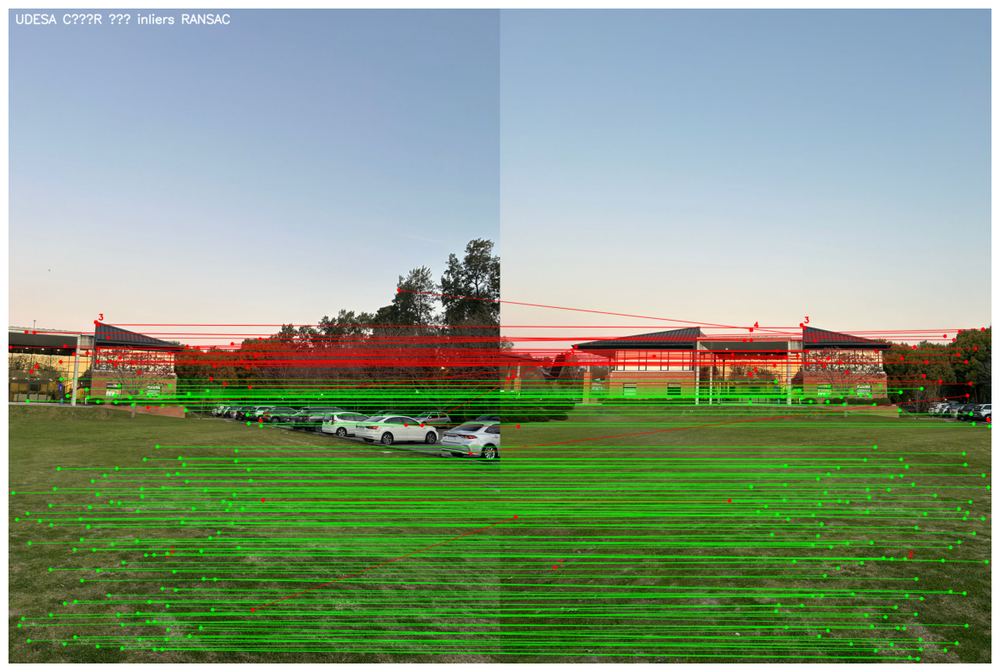

In [21]:

# --- UDESA L↔C ---
img_udesa_LC = draw_matches_ransac(L_udesa, L_udesa_kp_sel, C_udesa, C_udesa_kp_sel,
                             matches_udesa_IZ_CEN, result_UDESA_IZ_CEN,
                             title="UDESA L↔C — inliers RANSAC")
imshow(img_udesa_LC, figsize=(20,10))

# --- UDESA C↔R ---
img_udesa_CR = draw_matches_ransac(R_udesa, R_udesa_kp_sel, C_udesa, C_udesa_kp_sel,
                             matches_udesa_CEN_DER, result_UDESA_CEN_DER,
                             title="UDESA C↔R — inliers RANSAC")
imshow(img_udesa_CR, figsize=(20,10))



In [27]:
from src.graficos import stitch_three_images

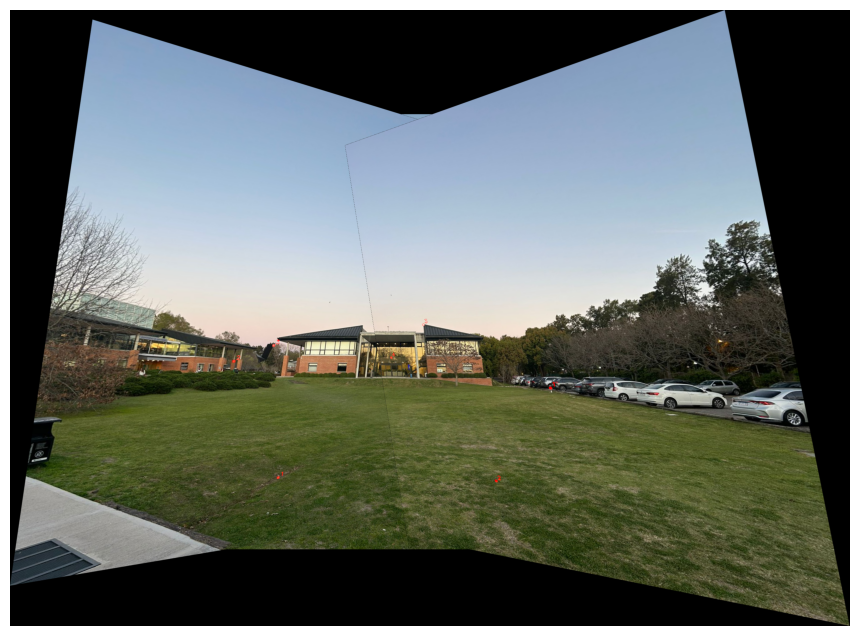

In [28]:
# Suponiendo que ya tenés las homografías por RANSAC:
# result_LC = ransac_homography(ptsL, ptsC)
# result_RC = ransac_homography(ptsR, ptsC)
H_LC = result_UDESA_IZ_CEN['H']
H_RC = result_UDESA_CEN_DER['H']

# Construir panorámica
panorama = stitch_three_images(L_udesa, C_udesa, R_udesa, H_LC, H_RC)

# Mostrar
import matplotlib.pyplot as plt
plt.figure(figsize=(15,8))
plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.axis('off'); plt.show()

